# Data Download

The goal of this part is to bring the mushroom dataset from Kaggle into the programming environment, so it’s ready for analysis and model training. We download and extract the data in a format that can be used for further data preprocessing, analysis, and machine learning

In [1]:
! kaggle datasets download -d uciml/mushroom-classification

Dataset URL: https://www.kaggle.com/datasets/uciml/mushroom-classification
License(s): CC0-1.0
  0% 0.00/34.2k [00:00<?, ?B/s]
100% 34.2k/34.2k [00:00<00:00, 36.6MB/s]


! kaggle datasets download: The exclamation mark (!) allows us to run command-line instructions directly within our Python notebook.
-d uciml/mushroom-classification: This specifies the dataset we want. The -d flag indicates the dataset to download, and uciml/mushroom-classification is the specific identifier for this mushroom dataset on Kaggle.
For this command to work, you must have the Kaggle API set up with proper authentication, including an API token saved in the environment. This setup is usually done by uploading your kaggle.json API key file to your working directory or using an environment variable.

In [2]:
! unzip /content/mushroom-classification.zip

Archive:  /content/mushroom-classification.zip
  inflating: mushrooms.csv           


! unzip: This command extracts the zip file containing the dataset.
/content/mushroom-classification.zip: This is the path to the downloaded zip file. Once extracted, it unpacks the data files, often in CSV format, so we can access and load them into a DataFrame in the next steps.

# Library Import

This section imports essential libraries used throughout the project for data manipulation, analysis, visualization, and preprocessing. Each library plays a specific role in making our data ready for training a machine learning model.

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.preprocessing import LabelEncoder



python
Copy code
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
Libraries:
Pandas (import pandas as pd):

Pandas is crucial for data manipulation and analysis.
Functionality: It provides powerful structures, like DataFrames and Series, which allow you to work with labeled data easily. For instance, you can read data into a DataFrame, clean it, and explore it with functions like .head(), .describe(), and .info().
NumPy (import numpy as np):

NumPy provides essential tools for numerical operations and array handling.
Functionality: It’s often used to perform efficient computations on arrays and matrices, which are foundational for handling and processing data for machine learning.
Matplotlib (import matplotlib.pyplot as plt):

Matplotlib is used for visualizing data.
Functionality: It allows us to create various types of plots (e.g., line plots, scatter plots, and histograms) that help to visually understand data distribution and relationships. In this project, it will support Seaborn in creating clear and informative charts.
Seaborn (import seaborn as sns):

Seaborn is a high-level interface for creating attractive statistical graphics.
Functionality: Built on top of Matplotlib, Seaborn simplifies creating visually appealing and informative charts like pair plots, heatmaps, and distribution plots. It’s used here for visualizing data distributions, relationships, and feature correlations.
LabelEncoder from Scikit-Learn (from sklearn.preprocessing import LabelEncoder):

LabelEncoder is used for encoding categorical variables.
Functionality: It converts categorical data into numerical labels, which are required for machine learning models. For example, transforming the "class" feature (edible vs. poisonous) from text labels to numeric values.

# Data Reading


This section loads the mushroom dataset into our Python environment, converting it into a DataFrame, which is a structured data format that allows for easy manipulation and analysis

In [4]:
data = pd.read_csv('/content/mushrooms.csv')
df = pd.DataFrame(data)
df

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,...,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,p,x,s,n,t,p,f,c,n,k,...,s,w,w,p,w,o,p,k,s,u
1,e,x,s,y,t,a,f,c,b,k,...,s,w,w,p,w,o,p,n,n,g
2,e,b,s,w,t,l,f,c,b,n,...,s,w,w,p,w,o,p,n,n,m
3,p,x,y,w,t,p,f,c,n,n,...,s,w,w,p,w,o,p,k,s,u
4,e,x,s,g,f,n,f,w,b,k,...,s,w,w,p,w,o,e,n,a,g
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8119,e,k,s,n,f,n,a,c,b,y,...,s,o,o,p,o,o,p,b,c,l
8120,e,x,s,n,f,n,a,c,b,y,...,s,o,o,p,n,o,p,b,v,l
8121,e,f,s,n,f,n,a,c,b,n,...,s,o,o,p,o,o,p,b,c,l
8122,p,k,y,n,f,y,f,c,n,b,...,k,w,w,p,w,o,e,w,v,l


pd.read_csv('/content/mushrooms.csv'):

Function: The pd.read_csv() function from Pandas is used to read a CSV (Comma-Separated Values) file.
Parameter: '/content/mushrooms.csv' specifies the path to the mushroom dataset we unzipped earlier.
Output: This function reads the data into a DataFrame format, which is a two-dimensional data structure, like a table, where data is organized into rows and columns.
df = pd.DataFrame(data):

This line explicitly creates a DataFrame from the data variable, though it’s not strictly necessary here since read_csv already returns a DataFrame. This line can be helpful if data were modified or transformed before being converted into a DataFrame.
df:

Writing df as the final line outputs the DataFrame df in the notebook, displaying the dataset so we can quickly inspect the data’s structure, features, and a few initial rows.
The Data Reading step is essential for bringing the data into a format where we can start exploring, cleaning, and processing it before training any machine learning models


In the Data Description section, we get an initial statistical summary of the dataset. This summary helps us understand the dataset's structure and get insights into each feature’s distribution, which is essential for guiding our data preprocessing and feature engineering steps

In [5]:
df.describe()

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,...,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
count,8124,8124,8124,8124,8124,8124,8124,8124,8124,8124,...,8124,8124,8124,8124,8124,8124,8124,8124,8124,8124
unique,2,6,4,10,2,9,2,2,2,12,...,4,9,9,1,4,3,5,9,6,7
top,e,x,y,n,f,n,f,c,b,b,...,s,w,w,p,w,o,p,w,v,d
freq,4208,3656,3244,2284,4748,3528,7914,6812,5612,1728,...,4936,4464,4384,8124,7924,7488,3968,2388,4040,3148


The purpose of this step is to give an overview of data ranges and distributions, highlight any potential outliers, and show whether each feature has missing values or anomalies. For example, if one category in a feature appears significantly more than others, we might consider its relevance or potential preprocessing steps


The Data Info section provides a detailed summary of the DataFrame’s structure, which helps us understand the data types, memory usage, and presence of missing values


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8124 entries, 0 to 8123
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   class                     8124 non-null   object
 1   cap-shape                 8124 non-null   object
 2   cap-surface               8124 non-null   object
 3   cap-color                 8124 non-null   object
 4   bruises                   8124 non-null   object
 5   odor                      8124 non-null   object
 6   gill-attachment           8124 non-null   object
 7   gill-spacing              8124 non-null   object
 8   gill-size                 8124 non-null   object
 9   gill-color                8124 non-null   object
 10  stalk-shape               8124 non-null   object
 11  stalk-root                8124 non-null   object
 12  stalk-surface-above-ring  8124 non-null   object
 13  stalk-surface-below-ring  8124 non-null   object
 14  stalk-color-above-ring  

The info() output is crucial because it provides a quick overview of the data's integrity and structure. For instance:

Identifying Missing Data: If any columns have fewer non-null entries than the total rows, they contain missing values, which might need handling.
Determining Data Types: Knowing which columns are object (categorical) vs. numeric helps guide our encoding and normalization steps.
Optimizing Memory: For large datasets, memory usage insights help us decide if we need to optimize or downcast data types


This line of code is handling missing or unknown values in the stalk-root column of the DataFrame df. Specifically, it replaces any occurrences of ? with u

In [7]:
df['stalk-root'].replace('?', 'u', inplace=True)

<ipython-input-7-7574f9b8d521>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['stalk-root'].replace('?', 'u', inplace=True)



Replacing ? with u standardizes unknown values in the stalk-root column, making it easier to handle missing data in a controlled way. This helps avoid errors in processing since ? is treated as a string, while u might be part of the expected values for this categorical feature.

This line of code attempts to remove any rows with missing values from the DataFrame df

In [8]:
df.dropna()

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,...,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,p,x,s,n,t,p,f,c,n,k,...,s,w,w,p,w,o,p,k,s,u
1,e,x,s,y,t,a,f,c,b,k,...,s,w,w,p,w,o,p,n,n,g
2,e,b,s,w,t,l,f,c,b,n,...,s,w,w,p,w,o,p,n,n,m
3,p,x,y,w,t,p,f,c,n,n,...,s,w,w,p,w,o,p,k,s,u
4,e,x,s,g,f,n,f,w,b,k,...,s,w,w,p,w,o,e,n,a,g
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8119,e,k,s,n,f,n,a,c,b,y,...,s,o,o,p,o,o,p,b,c,l
8120,e,x,s,n,f,n,a,c,b,y,...,s,o,o,p,n,o,p,b,v,l
8121,e,f,s,n,f,n,a,c,b,n,...,s,o,o,p,o,o,p,b,c,l
8122,p,k,y,n,f,y,f,c,n,b,...,k,w,w,p,w,o,e,w,v,l



This step is useful if we want to ensure that all rows used for analysis and modeling are complete, without any missing values. However, caution is needed when dropping data, as it could remove a substantial number of rows, potentially impacting the analysis if too much data is lost

explain this part
This line of code checks for any remaining missing values in each column of the DataFrame df and provides a summary

In [9]:
df.isna().sum()

,0
class,0
cap-shape,0
cap-surface,0
cap-color,0
bruises,0
odor,0
gill-attachment,0
gill-spacing,0
gill-size,0
gill-color,0



This command helps verify if there are any missing values left in the DataFrame after prior cleaning steps. For instance, if any column has non-zero values in this summary, it indicates that further handling may be needed for missing data in those columns

This line of code removes any duplicate rows in the DataFrame df, ensuring that only unique rows remain

In [10]:
df.drop_duplicates(inplace=True)

Removing duplicate rows is a crucial step for data quality and integrity. Duplicates can skew analysis or model training by introducing redundant information, leading to biased results or overfitting. Cleaning the data this way ensures that each observation is unique, which is essential for accurate modeling

This code iterates through each column in the DataFrame df and prints the column name along with all unique values in that column. It provides a quick look at the range of values each feature contains, which is useful for understanding the dataset and planning preprocessing steps

In [11]:
for i in df.columns:
  print(i, df[i].unique())

class ['p' 'e']
cap-shape ['x' 'b' 's' 'f' 'k' 'c']
cap-surface ['s' 'y' 'f' 'g']
cap-color ['n' 'y' 'w' 'g' 'e' 'p' 'b' 'u' 'c' 'r']
bruises ['t' 'f']
odor ['p' 'a' 'l' 'n' 'f' 'c' 'y' 's' 'm']
gill-attachment ['f' 'a']
gill-spacing ['c' 'w']
gill-size ['n' 'b']
gill-color ['k' 'n' 'g' 'p' 'w' 'h' 'u' 'e' 'b' 'r' 'y' 'o']
stalk-shape ['e' 't']
stalk-root ['e' 'c' 'b' 'r' 'u']
stalk-surface-above-ring ['s' 'f' 'k' 'y']
stalk-surface-below-ring ['s' 'f' 'y' 'k']
stalk-color-above-ring ['w' 'g' 'p' 'n' 'b' 'e' 'o' 'c' 'y']
stalk-color-below-ring ['w' 'p' 'g' 'b' 'n' 'e' 'y' 'o' 'c']
veil-type ['p']
veil-color ['w' 'n' 'o' 'y']
ring-number ['o' 't' 'n']
ring-type ['p' 'e' 'l' 'f' 'n']
spore-print-color ['k' 'n' 'u' 'h' 'w' 'r' 'o' 'y' 'b']
population ['s' 'n' 'a' 'v' 'y' 'c']
habitat ['u' 'g' 'm' 'd' 'p' 'w' 'l']



This snippet helps identify the range and type of values in each column, which is particularly useful for categorical features (e.g., "cap-shape," "odor") that need encoding. Understanding unique values can also reveal unexpected or erroneous values, which may require cleaning or preprocessing

This line initializes a LabelEncoder object, which is used to transform categorical data into numerical values for machine learning models

In [12]:
le = LabelEncoder()

Creating an instance of LabelEncoder prepares it for use in transforming columns of the DataFrame from categorical to numerical values, making the dataset compatible with machine learning algorithms

This code applies LabelEncoder to each column in the DataFrame df, transforming all categorical values in each column into numerical values

In [13]:
for i in df.columns:
  df[i] = le.fit_transform(df[i])

The loop applies LabelEncoder to every column in the DataFrame, encoding all categorical data as numbers, which is essential for compatibility with most machine learning algorithms. This step is particularly useful when the dataset is entirely categorical, like this mushroom dataset, to prepare it for model training


The Data Info section provides a detailed summary of the DataFrame’s structure, which helps us understand the data types, memory usage, and presence of missing values

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8124 entries, 0 to 8123
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype
---  ------                    --------------  -----
 0   class                     8124 non-null   int64
 1   cap-shape                 8124 non-null   int64
 2   cap-surface               8124 non-null   int64
 3   cap-color                 8124 non-null   int64
 4   bruises                   8124 non-null   int64
 5   odor                      8124 non-null   int64
 6   gill-attachment           8124 non-null   int64
 7   gill-spacing              8124 non-null   int64
 8   gill-size                 8124 non-null   int64
 9   gill-color                8124 non-null   int64
 10  stalk-shape               8124 non-null   int64
 11  stalk-root                8124 non-null   int64
 12  stalk-surface-above-ring  8124 non-null   int64
 13  stalk-surface-below-ring  8124 non-null   int64
 14  stalk-color-above-ring    8124 non-null 

The info() output is crucial because it provides a quick overview of the data's integrity and structure. For instance:

Identifying Missing Data: If any columns have fewer non-null entries than the total rows, they contain missing values, which might need handling. Determining Data Types: Knowing which columns are object (categorical) vs. numeric helps guide our encoding and normalization steps. Optimizing Memory: For large datasets, memory usage insights help us decide if we need to optimize or downcast data types

In [15]:
df

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,...,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,1,5,2,4,1,6,1,0,1,4,...,2,7,7,0,2,1,4,2,3,5
1,0,5,2,9,1,0,1,0,0,4,...,2,7,7,0,2,1,4,3,2,1
2,0,0,2,8,1,3,1,0,0,5,...,2,7,7,0,2,1,4,3,2,3
3,1,5,3,8,1,6,1,0,1,5,...,2,7,7,0,2,1,4,2,3,5
4,0,5,2,3,0,5,1,1,0,4,...,2,7,7,0,2,1,0,3,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8119,0,3,2,4,0,5,0,0,0,11,...,2,5,5,0,1,1,4,0,1,2
8120,0,5,2,4,0,5,0,0,0,11,...,2,5,5,0,0,1,4,0,4,2
8121,0,2,2,4,0,5,0,0,0,5,...,2,5,5,0,1,1,4,0,1,2
8122,1,3,3,4,0,8,1,0,1,0,...,1,7,7,0,2,1,0,7,4,2


# PairPlot

This code creates a pair plot for all features in the DataFrame df, using the column 'class' as the hue. The pair plot is then saved as an image file and displayed

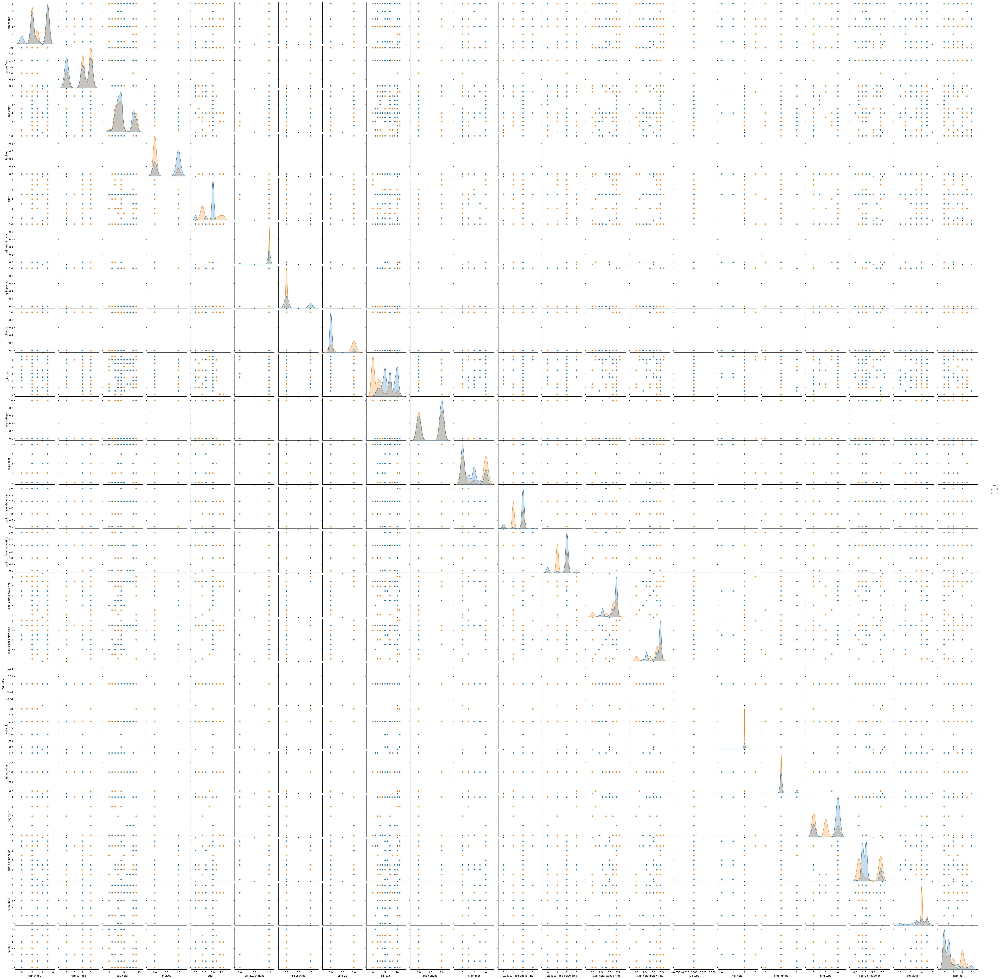

In [ ]:
sns.pairplot(df, hue='class')
plt.savefig("pairplot.png", format='png', dpi=300)

plt.show()

This visualization helps analyze feature relationships in the dataset and see how well the classes (edible vs. poisonous) are separated in each feature pair. Saving the plot as an image allows for future reference or reporting

# Distribution Plot

This code generates individual distribution plots for each column in the DataFrame df within a single figure, arranging them vertically as subplots. It saves the entire figure as one image file and displays it

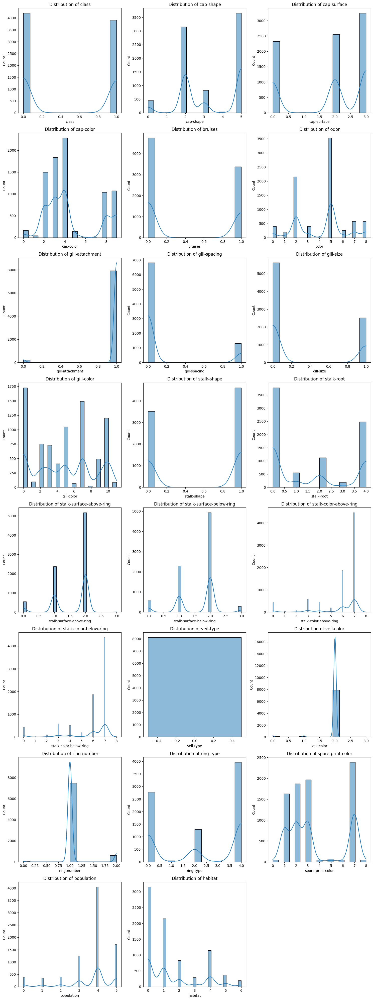

In [ ]:
numeric_columns = df.select_dtypes(include=['number']).columns

n_cols = 3
n_rows = (len(numeric_columns) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

for i, column in enumerate(numeric_columns):
    sns.histplot(df[column], kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {column}')

if len(numeric_columns) < len(axes):
    for j in range(len(numeric_columns), len(axes)):
        axes[j].set_visible(False)


plt.tight_layout()
plt.savefig('numeric_columns_distribution.png')
plt.show()

This setup plots the distribution of each column in the DataFrame within a single image, saved as "distributions.png." It helps to visually analyze the spread of each feature and identify any skewness, outliers, or unusual patterns in the data



# Box Plot


This section of code creates a single figure with multiple subplots, each showing the box plot for a different column in the DataFrame df.

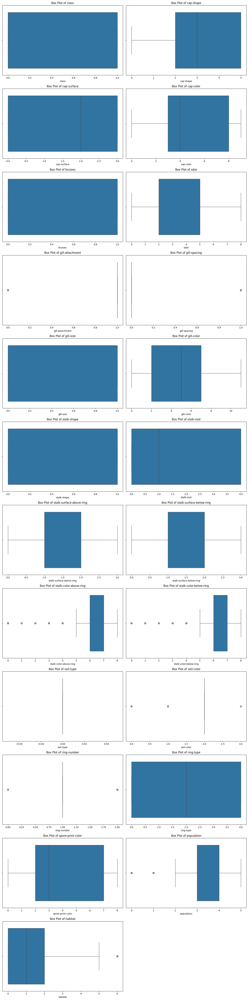

In [ ]:
n_cols = 2
n_rows = (len(numeric_columns) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

for i, column in enumerate(numeric_columns):
    sns.boxplot(x=df[column], ax=axes[i])
    axes[i].set_title(f'Box Plot of {column}')

if len(numeric_columns) < len(axes):
    for j in range(len(numeric_columns), len(axes)):
        axes[j].set_visible(False)

plt.tight_layout()
plt.savefig('numeric_columns_boxplots.png')
plt.show()

now we are terning our data frame to a correlation or matrix

because now we analys it easier

# Correlation Matrix


This code calculates the correlation matrix for the DataFrame df and then displays it. Here's a breakdown:

df.corr():

This part calculates the correlation matrix for all numerical columns in the DataFrame df.
Correlation measures the linear relationship between two variables, with values ranging from -1 to +1:
+1: Perfect positive correlation (as one variable increases, so does the other).
-1: Perfect negative correlation (as one variable increases, the other decreases).
0: No correlation (no linear relationship between the variables).
This matrix is a square table where each cell at position (i, j) shows the correlation between the i-th and j-th columns in the DataFrame.
corr:

This variable stores the correlation matrix produced by df.corr().
Displaying corr will show a table with correlation values between each pair of numerical columns in df.
In your project, this matrix can help reveal relationships between features (like cap shape, color, etc.) and the poisonous or edible label

In [ ]:
corr = df.corr()

corr

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,...,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
class,1.000000,0.052951,0.178446,-0.031384,-0.501530,-0.093552,0.129200,-0.348387,0.540024,-0.530566,...,-0.298801,-0.154003,-0.146730,NaN,0.145142,-0.214366,-0.411771,0.171961,0.298686,0.217179
cap-shape,0.052951,1.000000,-0.050454,-0.048203,-0.035374,-0.021935,0.078865,0.013196,0.054050,-0.006039,...,-0.032591,-0.031659,-0.030390,NaN,0.072560,-0.106534,-0.025457,-0.073416,0.063413,-0.042221
cap-surface,0.178446,-0.050454,1.000000,-0.019402,0.070228,0.045233,-0.034180,-0.282306,0.208100,-0.161017,...,0.107965,0.066050,0.068885,NaN,-0.016603,-0.026147,-0.106407,0.230364,0.021555,0.163887
cap-color,-0.031384,-0.048203,-0.019402,1.000000,-0.000764,-0.387121,0.041436,0.144259,-0.169464,0.084659,...,-0.047710,0.002364,0.008057,NaN,0.036130,-0.005822,0.162513,-0.293523,-0.144770,0.033925
bruises,-0.501530,-0.035374,0.070228,-0.000764,1.000000,-0.061825,0.137359,-0.299473,-0.369596,0.527120,...,0.458983,0.083538,0.092874,NaN,0.119770,0.056788,0.692973,-0.285008,0.088137,-0.075095
odor,-0.093552,-0.021935,0.045233,-0.387121,-0.061825,1.000000,-0.059590,0.063936,0.310495,-0.129213,...,0.061820,0.174532,0.169407,NaN,-0.057747,0.111905,-0.281387,0.469055,-0.043623,-0.026610
gill-attachment,0.129200,0.078865,-0.034180,0.041436,0.137359,-0.059590,1.000000,0.071489,0.108984,-0.128567,...,-0.116177,0.099299,0.097160,NaN,0.897518,0.093236,-0.146689,-0.029524,0.165575,-0.030304
gill-spacing,-0.348387,0.013196,-0.282306,0.144259,-0.299473,0.063936,0.071489,1.000000,-0.108333,0.100193,...,-0.213775,0.274574,0.253505,NaN,0.073363,0.243014,-0.195897,0.047323,-0.529253,-0.154680
gill-size,0.540024,0.054050,0.208100,-0.169464,-0.369596,0.310495,0.108984,-0.108333,1.000000,-0.516736,...,0.010894,0.296548,0.278708,NaN,0.103809,-0.171362,-0.460872,0.622991,0.147682,0.161418
gill-color,-0.530566,-0.006039,-0.161017,0.084659,0.527120,-0.129213,-0.128567,0.100193,-0.516736,1.000000,...,0.257224,-0.058299,-0.074781,NaN,-0.097583,0.096054,0.629398,-0.416135,-0.034090,-0.202972


In [ ]:
mask = np.triu(np.ones_like(corr, dtype=bool))

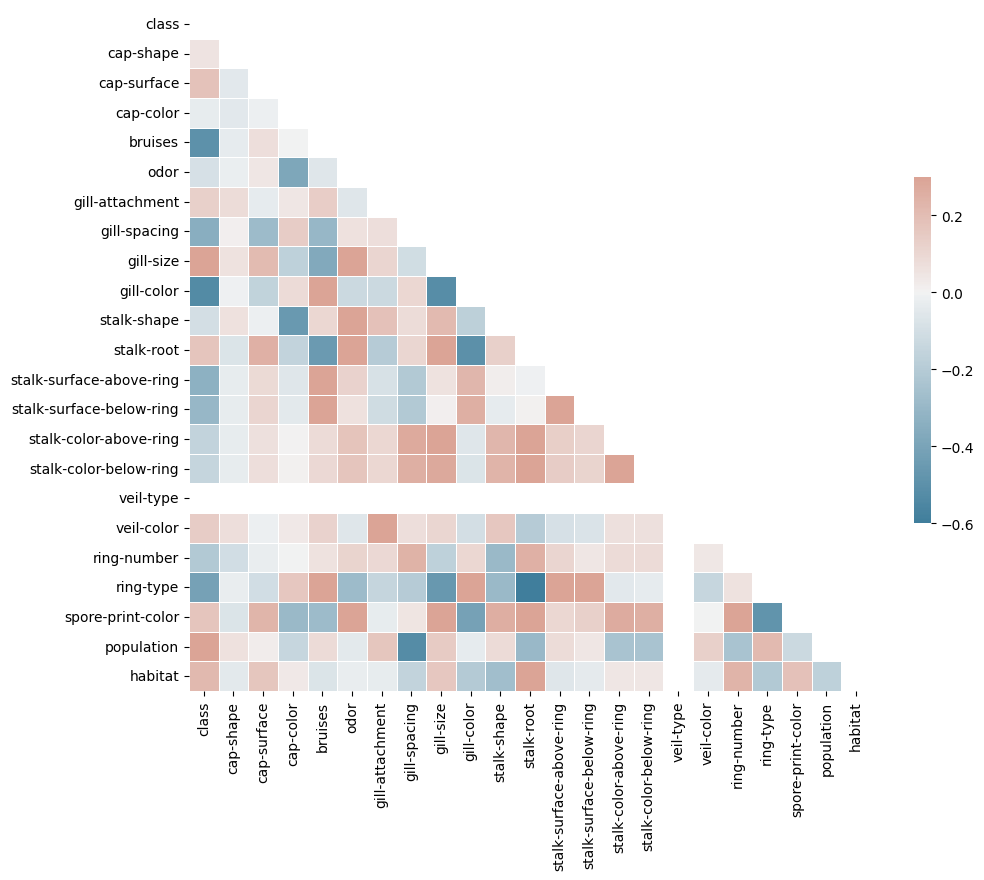

In [ ]:
f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.show()

# Normalization

1️⃣ Importing StandardScaler

In [16]:
from sklearn.preprocessing import StandardScaler

This imports the StandardScaler class from sklearn.preprocessing.
StandardScaler is used to standardize features by removing the mean and scaling to unit variance.
Standardization (Z-score normalization) ensures that all features have a mean of 0 and a standard deviation of 1

2️⃣ Splitting the Dataset into Features (X) and Target (y)

In [17]:
y = df.iloc[:, 0]
x = df.iloc[:, 1:]

df.iloc[:, 0] selects the first column of the DataFrame (df) and assigns it to y.
This is assumed to be the target variable (whether the mushroom is edible or poisonous).
df.iloc[:, 1:] selects all columns except the first one, which represent the features (x).
These are the input variables used to train the model.

3️⃣ Fitting and Transforming the Data

Computes the mean and standard deviation for each feature in x (using fit()).
Scales the data using the formula (using transform()):
�
μ = Mean of the feature

�
σ = Standard deviation of the feature

The transformed data (x_scaled) now has:

A mean of 0
A standard deviation of 1


In [18]:
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

✅ Summary

Extracts y (target) and x (features) from the dataset.
Uses StandardScaler to standardize the feature values.
x_scaled now contains standardized data with zero mean and unit variance

# Train Test Split

1️⃣ Importing train_test_split

In [19]:
from sklearn.model_selection import train_test_split

This imports the train_test_split function from sklearn.model_selection.
It is used to split the dataset into training and testing sets.
This helps in evaluating how well a machine learning model generalizes to new, unseen data.

2️⃣ Splitting the Data


In [20]:
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, train_size=0.7, random_state=42)

train_test_split(x_scaled, y, train_size=0.7, random_state=42)

Splits the features (x_scaled) and target (y) into training and testing sets.
x_scaled: Standardized features.
y: Target labels (edible or poisonous).
Returned Values:

x_train: 70% of the feature data for training.
x_test: 30% of the feature data for testing.
y_train: 70% of the target labels for training.
y_test: 30% of the target labels for testing.
Parameters Explained:
train_size=0.7

70% of the data is assigned to training.
The remaining 30% is used for testing (implicitly test_size=0.3).
random_state=42

Ensures the split is reproducible.
If you run the code again, you get the same split every time.
Changing random_state will give a different random split.

# svm

1. Importing Necessary Libraries

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

classification_report and confusion_matrix from sklearn.metrics:

These are used to evaluate the performance of the model after predictions. classification_report provides detailed metrics (precision, recall, F1-score), and confusion_matrix shows the confusion matrix to assess how well the model predicted each class.
SVC from sklearn.svm:

SVC (Support Vector Classification) is the actual model used in this section. It's a type of supervised machine learning model that's used for classification tasks.
GridSearchCV from sklearn.model_selection:

GridSearchCV helps you search through a range of hyperparameters to find the best combination. It performs cross-validation to evaluate the performance of the model for each combination of parameters.

2. Defining the Hyperparameter Grid for SVM

In [ ]:
param_grid_svm = {
    'C': [0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf', 'poly'],
    'degree': [2, 3, 4],
    'gamma': ['scale', 'auto', 0.001, 0.01, 0.1, 1],
    'coef0': [0.0, 0.1, 0.5, 1],
}

param_grid_svm is a dictionary that defines the range of hyperparameters to be tested for the SVM model. The grid will search across these parameters to find the best combination:
C: Regularization parameter (controls the trade-off between margin maximization and classification error). Higher values can lead to overfitting.
kernel: Type of kernel to be used. Options include:
'linear': A linear kernel.
'rbf': Radial basis function kernel (commonly used).
'poly': Polynomial kernel.
degree: Degree of the polynomial kernel function (only relevant for 'poly').
gamma: Kernel coefficient for 'rbf', 'poly', and 'sigmoid' kernels. It controls the curvature of the decision boundary.
coef0: A parameter for the polynomial and sigmoid kernels that affects the shape of the decision boundary.

3. Initializing the SVM Model

In [ ]:
svm = SVC()

svm is an instance of the SVC class. This will be the machine learning model that we use for training and prediction.

4. Setting Up GridSearchCV for Hyperparameter Tuning

In [ ]:
svm_grid = GridSearchCV(estimator=svm, param_grid=param_grid_svm, cv=3, scoring='accuracy', return_train_score=True, verbose=3)

GridSearchCV:
estimator=svm: We specify the SVM model to optimize.
param_grid=param_grid_svm: This is the grid of hyperparameters we defined earlier.
cv=3: 3-fold cross-validation is used to evaluate each parameter combination.
scoring='accuracy': The performance metric used to evaluate the model's performance. In this case, accuracy.
return_train_score=True: It will return the training score in addition to the test score for each parameter combination.
verbose=3: This controls the verbosity of the output during the grid search process. A higher number will provide more detailed logs.

5. Fitting the Model with the Best Hyperparameters

In [ ]:
svm_grid.fit(x_scaled, y)

Fitting 3 folds for each of 864 candidates, totalling 2592 fits
[CV 1/3] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=linear;, score=(train=0.981, test=0.742) total time=   0.2s
[CV 2/3] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=linear;, score=(train=0.967, test=0.921) total time=   0.2s
[CV 3/3] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=linear;, score=(train=0.974, test=0.889) total time=   0.2s
[CV 1/3] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=rbf;, score=(train=0.996, test=0.731) total time=   0.3s
[CV 2/3] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=rbf;, score=(train=0.998, test=0.927) total time=   0.4s
[CV 3/3] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=rbf;, score=(train=0.996, test=0.699) total time=   0.5s
[CV 1/3] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=poly;, score=(train=0.991, test=0.723) total time=   0.4s
[CV 2/3] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=poly;, score=(train=0.998, test=0.924) 

GridSearchCV(cv=3, estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100], 'coef0': [0.0, 0.1, 0.5, 1],
                         'degree': [2, 3, 4],
                         'gamma': ['scale', 'auto', 0.001, 0.01, 0.1, 1],
                         'kernel': ['linear', 'rbf', 'poly']},
             return_train_score=True, scoring='accuracy', verbose=3)

6. Displaying the Best Hyperparameters

In [ ]:
svm_grid.best_params_

{'C': 100, 'coef0': 1, 'degree': 3, 'gamma': 0.01, 'kernel': 'poly'}

After training, this line outputs the best combination of hyperparameters found by GridSearchCV.

7. Displaying the Best Model's Performance Score

In [ ]:
svm_grid.best_score_

0.9212210733628755

This shows the best performance score (accuracy) achieved with the best combination of hyperparameters.

8. Initializing the Best SVM Model

In [ ]:
best_svm = SVC(C=100, coef0=1, degree=3, gamma=0.01, kernel='poly')

best_svm: Here, we are manually initializing the SVM model with the best-found hyperparameters from the grid search (for example, C=100, kernel='poly', etc.). These parameters are used for the final training.

9. Training the Best SVM Model

In [ ]:
best_svm.fit(x_train, y_train)
y_pred_test_svm = best_svm.predict(x_test)

This trains the best_svm model using the training data (x_train, y_train).

10. Making Predictions on the Test Set

In [ ]:
print(classification_report(y_test, y_pred_test_svm))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1257
           1       1.00      1.00      1.00      1181

    accuracy                           1.00      2438
   macro avg       1.00      1.00      1.00      2438
weighted avg       1.00      1.00      1.00      2438



This generates predictions on the test set (x_test) using the trained model. The result is stored in y_pred_test_svm.

In [ ]:
y_pred_train_svm = best_svm.predict(x_train)
print(classification_report(y_train,y_pred_train_svm))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2951
           1       1.00      1.00      1.00      2735

    accuracy                           1.00      5686
   macro avg       1.00      1.00      1.00      5686
weighted avg       1.00      1.00      1.00      5686



10. Creating a DataFrame for Predictions

In [ ]:
df_svm = pd.DataFrame(x_test)
df_svm['Predicted'] = y_pred_test_svm

This creates a new DataFrame where the x_test features are shown along with their corresponding predicted labels (y_pred_test_svm).

11. Visualizing the Predictions with a Pair Plot

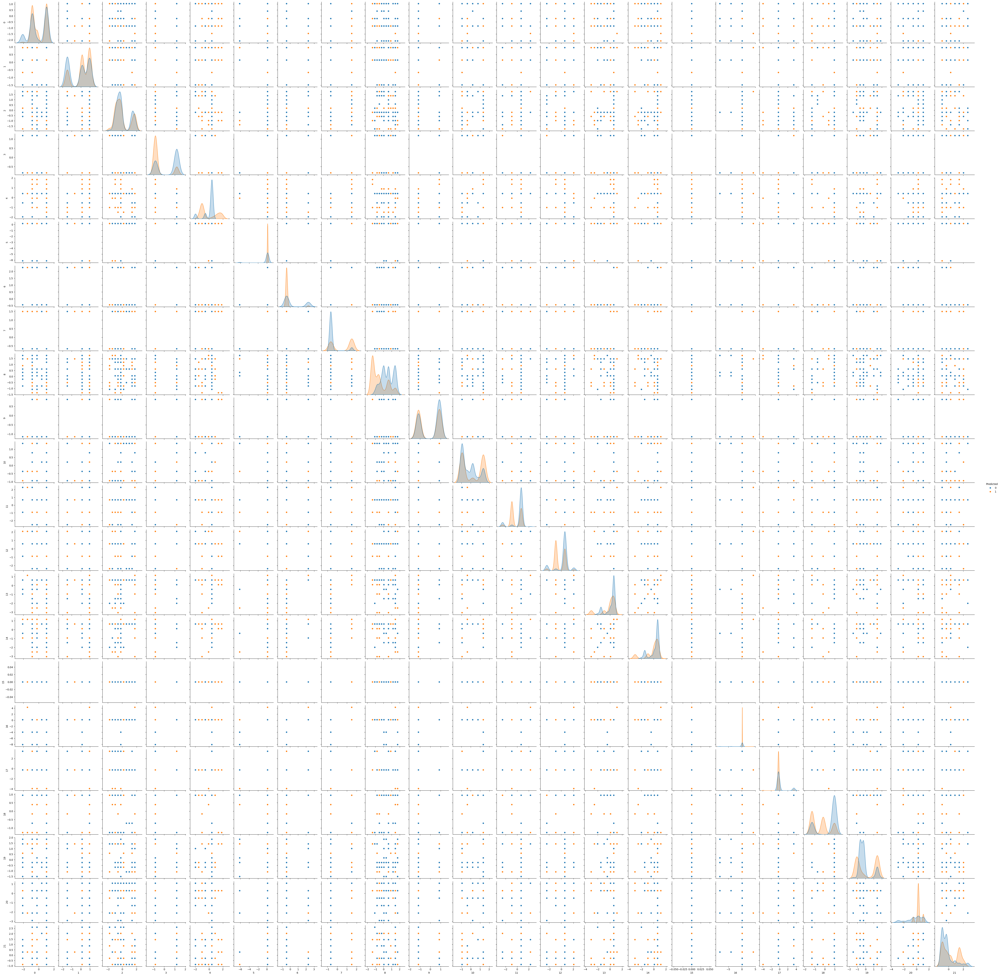

In [ ]:
sns.pairplot(df_svm, hue='Predicted')
plt.show()

This visualizes the pairwise relationships between the features, color-coded by the predicted class (Predicted). It's helpful for visually inspecting how well the model distinguishes between the classes.

# KNN

1. Importing Necessary Libraries

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

This is the KNN classifier model that will be used for classification. It makes predictions based on the majority vote of the 'k' nearest neighbors of a data point.
GridSearchCV from sklearn.model_selection:

This tool helps to search through different combinations of hyperparameters to find the best model by performing cross-validation.
classification_report from sklearn.metrics:

After the model makes predictions, this function generates a detailed performance report with metrics like precision, recall, F1-score, and support.

2. Defining the Hyperparameter Grid for KNN

In [ ]:
param_grid_kn = {
    'n_neighbors': [3, 5, 7, 9, 11],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski'],
    'p': [1, 2]
}

param_grid_knn is a dictionary containing the range of hyperparameters to be tuned for the KNN model. This grid defines:
n_neighbors: Number of neighbors to use for classification. The higher the number, the smoother the decision boundary becomes. Values like 3, 5, 7, etc., are typically tested.
weights: Determines how the neighbors are weighted:
'uniform': All neighbors are weighted equally.
'distance': Neighbors are weighted by their distance, with closer neighbors having more influence.
metric: The distance metric used to calculate the distance between data points. Common metrics are:
'euclidean': Straight-line distance.
'manhattan': Sum of absolute differences.
'minkowski': A generalization of both Euclidean and Manhattan distances.

3. Initializing the KNN Model

In [ ]:
kn = KNeighborsClassifier()

This initializes the KNeighborsClassifier model, which will later be used for training and making predictions.

4. Setting Up GridSearchCV for Hyperparameter Tuning

In [ ]:
kn_grid = GridSearchCV(estimator=kn, param_grid=param_grid_kn, cv=5, scoring='accuracy', return_train_score=True, verbose=3)

estimator=knn: The KNN model to be optimized.
param_grid=param_grid_knn: The grid of hyperparameters we defined earlier.
cv=3: 3-fold cross-validation will be used to evaluate each hyperparameter combination.
scoring='accuracy': The performance metric used is accuracy, which measures the proportion of correct predictions.
return_train_score=True: This allows the training scores to be returned along with test scores for each hyperparameter combination.
verbose=3: Controls how much detail is shown during the grid search process. Higher values provide more detailed logs.

5. Fitting the Model with the Best Hyperparameters

In [ ]:
kn_grid.fit(x, y)

Fitting 5 folds for each of 60 candidates, totalling 300 fits
[CV 1/5] END metric=euclidean, n_neighbors=3, p=1, weights=uniform;, score=(train=1.000, test=0.852) total time=   0.4s
[CV 2/5] END metric=euclidean, n_neighbors=3, p=1, weights=uniform;, score=(train=1.000, test=1.000) total time=   0.3s
[CV 3/5] END metric=euclidean, n_neighbors=3, p=1, weights=uniform;, score=(train=1.000, test=0.955) total time=   0.3s
[CV 4/5] END metric=euclidean, n_neighbors=3, p=1, weights=uniform;, score=(train=1.000, test=1.000) total time=   0.3s
[CV 5/5] END metric=euclidean, n_neighbors=3, p=1, weights=uniform;, score=(train=1.000, test=0.538) total time=   0.3s
[CV 1/5] END metric=euclidean, n_neighbors=3, p=1, weights=distance;, score=(train=1.000, test=0.853) total time=   0.3s
[CV 2/5] END metric=euclidean, n_neighbors=3, p=1, weights=distance;, score=(train=1.000, test=1.000) total time=   0.3s
[CV 3/5] END metric=euclidean, n_neighbors=3, p=1, weights=distance;, score=(train=1.000, test=0

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'metric': ['euclidean', 'manhattan', 'minkowski'],
                         'n_neighbors': [3, 5, 7, 9, 11], 'p': [1, 2],
                         'weights': ['uniform', 'distance']},
             return_train_score=True, scoring='accuracy', verbose=3)

This step trains the KNN model using the scaled features (x_scaled) and the target labels (y). The grid search will evaluate different combinations of the hyperparameters defined in param_grid_knn to find the best ones.

6. Displaying the Best Hyperparameters

In [ ]:
kn_grid.best_params_

{'metric': 'manhattan', 'n_neighbors': 3, 'p': 1, 'weights': 'distance'}

This shows the best combination of hyperparameters found by the grid search after training. These are the optimal values for n_neighbors, weights, and metric.

7. Displaying the Best Model's Performance Score

In [ ]:
kn_grid.best_score_

0.8926303145130732

This outputs the best accuracy score achieved during the grid search with the best-found hyperparameters

8. Initializing the Best KNN Model

In [ ]:
best_knn = KNeighborsClassifier(metric='manhattan', n_neighbors=3, p=1, weights='distance' )

Here, we manually initialize the KNN model with the best hyperparameters from the grid search, such as n_neighbors=5, weights='uniform', and metric='euclidean'. These hyperparameters are used for the final training.

9. Training the Best KNN Model

In [ ]:
best_knn.fit(x_train,y_train)

KNeighborsClassifier(metric='manhattan', n_neighbors=7, p=1, weights='distance')

This trains the best_knn model on the training data (x_train, y_train). It learns how to classify the mushrooms based on the training examples.

10. Making Predictions on the Test Set

In [ ]:
y_pred_test_knn=best_knn.predict(x_test)

This generates predictions on the test set (x_test) using the trained KNN model. The predicted labels are stored in y_pred_test_knn.

11. Evaluating the Model on the Test Set

In [ ]:
print(classification_report(y_test,y_pred_test_knn))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1257
           1       1.00      1.00      1.00      1181

    accuracy                           1.00      2438
   macro avg       1.00      1.00      1.00      2438
weighted avg       1.00      1.00      1.00      2438



In [ ]:
df_knn = pd.DataFrame(x_test)
df_knn['Predicted'] = y_pred_test_knn

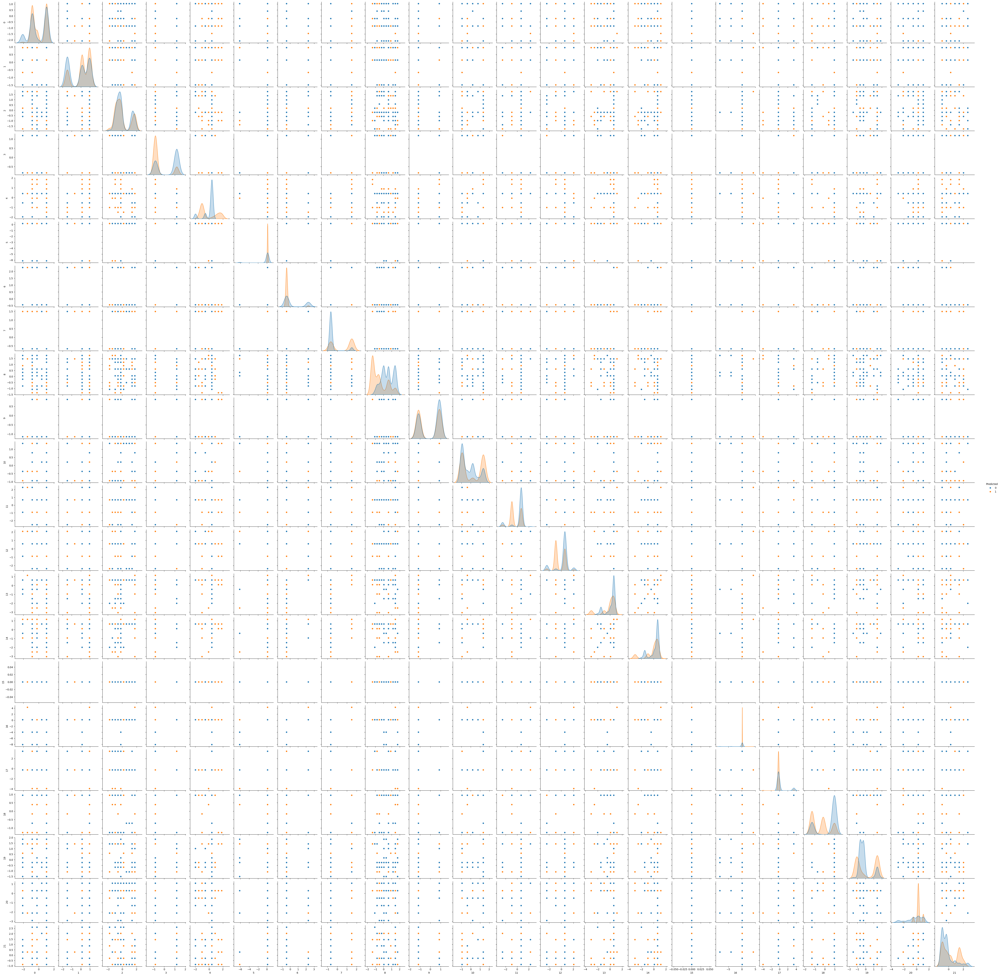

In [ ]:
sns.pairplot(df_knn, hue='Predicted')
plt.show()

#Decision Tree Classifier

1. Importing Necessary Libraries

In [21]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

DecisionTreeClassifier from sklearn.tree:

This is the Decision Tree model used for classification. It works by recursively splitting the data based on feature values to form a tree structure, where each leaf represents a class label.
GridSearchCV from sklearn.model_selection:

This tool helps to search through different combinations of hyperparameters and finds the best model by performing cross-validation.
classification_report from sklearn.metrics:

This function generates a detailed performance report, including precision, recall, F1-score, and support for each class, which helps evaluate the model's performance.

2. Defining the Hyperparameter Grid for Decision Tree

In [22]:
param_grid_dt = {
    'criterion': ['gini', 'entropy', 'log_loss'],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5, 10],
    'max_features': [None, 'sqrt', 'log2'],
    'splitter': ['best', 'random'],
    'max_leaf_nodes': [None, 10, 20, 50],
    'ccp_alpha': [0.0, 0.01, 0.1]
}

param_grid_dtc: This dictionary defines the grid of hyperparameters to be tuned for the Decision Tree model. The grid includes:
criterion: The function used to measure the quality of a split:
'gini': Gini impurity.
'entropy': Information gain (based on entropy).
max_depth: The maximum depth of the tree. Higher values result in a more complex tree.
min_samples_split: The minimum number of samples required to split an internal node.
min_samples_leaf: The minimum number of samples required to be at a leaf node.

3. Initializing the Decision Tree Model

In [23]:
dt = DecisionTreeClassifier()

dtc: This initializes the DecisionTreeClassifier, which will be used for training and making predictions.

4. Setting Up GridSearchCV for Hyperparameter Tuning

In [24]:
dt_grid = GridSearchCV(estimator=dt, param_grid=param_grid_dt, cv=5, scoring='accuracy', return_train_score=True, verbose=3)

GridSearchCV:
estimator=dtc: The Decision Tree model to be optimized.
param_grid=param_grid_dtc: The grid of hyperparameters to test.
cv=3: 3-fold cross-validation is used for evaluating each hyperparameter combination.
scoring='accuracy': The evaluation metric is accuracy, which measures the percentage of correct predictions.
return_train_score=True: This returns the training scores along with test scores for each hyperparameter combination.
verbose=3: This controls the verbosity of the grid search process. A higher value provides more detailed logs.

5. Fitting the Model with the Best Hyperparameters

In [25]:
dt_grid.fit(x, y)

Streaming output truncated to the last 5000 lines.
[CV 1/5] END ccp_alpha=0.1, criterion=log_loss, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=(train=0.955, test=0.719) total time=   0.0s
[CV 2/5] END ccp_alpha=0.1, criterion=log_loss, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=(train=0.813, test=0.549) total time=   0.0s
[CV 3/5] END ccp_alpha=0.1, criterion=log_loss, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=(train=0.941, test=0.808) total time=   0.0s
[CV 4/5] END ccp_alpha=0.1, criterion=log_loss, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=(train=0.879, test=0.915) total time=   0.0s
[CV 5/5] END ccp_alpha=0.1, criterion=log_loss, max_depth=None, max_features=sqrt, max_leaf_nodes=20, min_sam

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'ccp_alpha': [0.0, 0.01, 0.1],
                         'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [None, 10, 20, 30],
                         'max_features': [None, 'sqrt', 'log2'],
                         'max_leaf_nodes': [None, 10, 20, 50],
                         'min_samples_leaf': [1, 2, 5, 10],
                         'min_samples_split': [2, 5, 10],
                         'splitter': ['best', 'random']},
             return_train_score=True, scoring='accuracy', verbose=3)

This step trains the Decision Tree model using the scaled features (x_scaled) and the target labels (y). The grid search will test different combinations of hyperparameters to find the optimal values.

6. Displaying the Best Hyperparameters

In [26]:
dt_grid.best_params_

{'ccp_alpha': 0.0,
 'criterion': 'log_loss',
 'max_depth': 30,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_samples_leaf': 1,
 'min_samples_split': 5,
 'splitter': 'random'}

This returns the best combination of hyperparameters found by the grid search. These hyperparameters will result in the highest accuracy for the model.

7. Displaying the Best Model's Performance Score

In [27]:
dt_grid.best_score_

0.994088669950739

This shows the best accuracy score achieved during the grid search, with the optimal hyperparameters.

8. Initializing the Best Decision Tree Model

In [2]:
best_dt = DecisionTreeClassifier(ccp_alpha = 0.0,criterion= 'log_loss',max_depth= 30,max_features= None, max_leaf_nodes= None,min_samples_leaf=1,min_samples_split= 5, splitter= 'random')

NameError: name 'DecisionTreeClassifier' is not defined

This initializes the Decision Tree model with the best hyperparameters found by the grid search. For example, if the grid search found that 'entropy' as the criterion, max_depth=10, min_samples_split=5, and min_samples_leaf=2 provided the best results, these values are used for the final model.

9. Training the Best Decision Tree Model

In [ ]:
best_dt.fit(x_train, y_train)

This trains the best_dtc model on the training data (x_train, y_train). The model learns how to classify the mushrooms based on the training examples.

10. Making Predictions on the Test Set

In [ ]:
dt.fit(x_train, y_train)
y_pred_test_dt = best_dt.predict(x_test)

This generates predictions on the test set (x_test) using the trained Decision Tree model. The predicted labels are stored in y_pred_test_dtc.

11. Evaluating the Model on the Test Set

In [ ]:
print(classification_report(y_test, y_pred_test_dt))

This prints a detailed classification report for the test set. It includes metrics such as precision, recall, F1-score, and support for each class.

12. Making Predictions on the Training Set

In [ ]:
y_pred_train_dt = best_dt.predict(x_train)
print(classification_report(y_train, y_pred_train_dt))

This evaluates the model on the training set (x_train). It helps check if the model is overfitting (too good on training data) or underfitting (poor performance on both training and test data).

This evaluates the model on the training set (x_train). It helps check if the model is overfitting (too good on training data) or underfitting (poor performance on both training and test data).

13. Creating a DataFrame for Predictions

In [ ]:
df_dt = pd.DataFrame(x_test)
df_dt['Predicted'] = y_pred_test_dt

This creates a DataFrame that includes the test features (x_test) and their predicted labels (y_pred_test_dtc). This makes it easier to inspect the predictions alongside the feature values.

14. Visualizing the Predictions with a Pair Plot

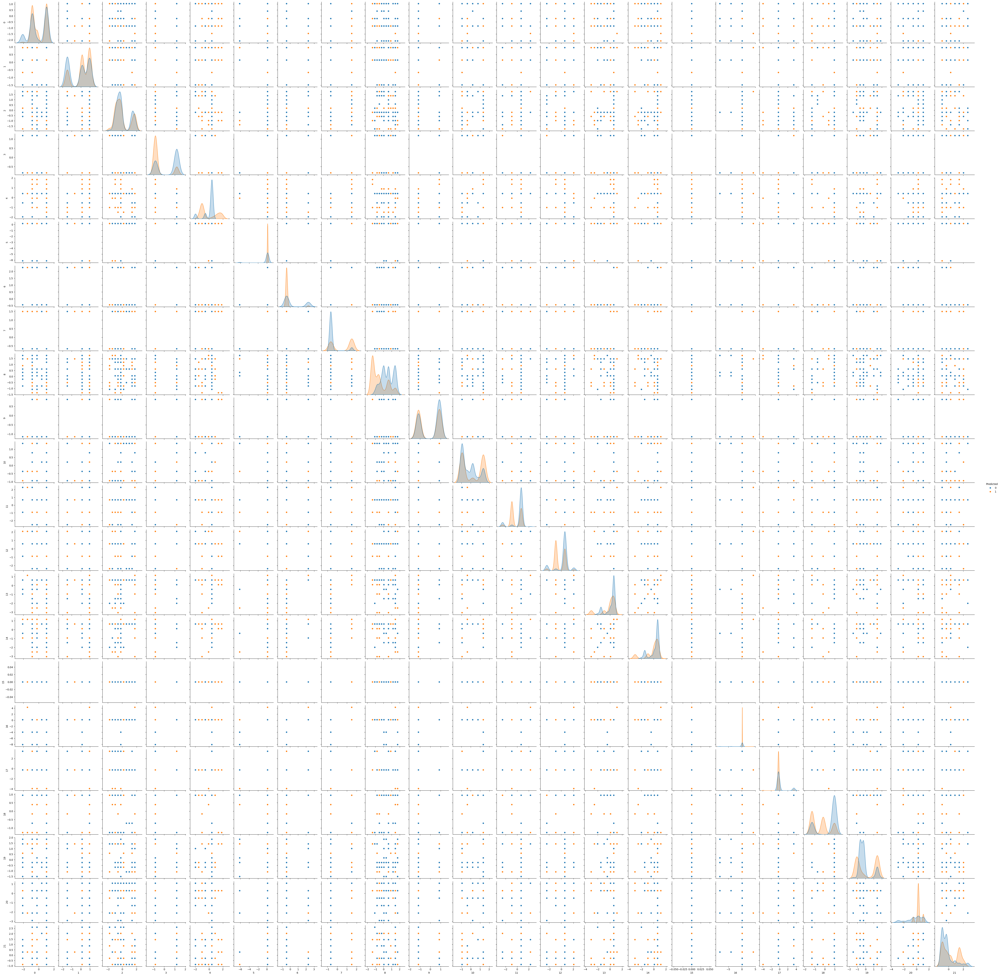

In [ ]:
sns.pairplot(df_dt, hue='Predicted')
plt.show()

This visualizes the pairwise relationships between features, color-coded by the predicted class (Predicted). It helps to visually assess how well the Decision Tree model is separating the different classes.

In [ ]:
from sklearn.tree import plot_tree

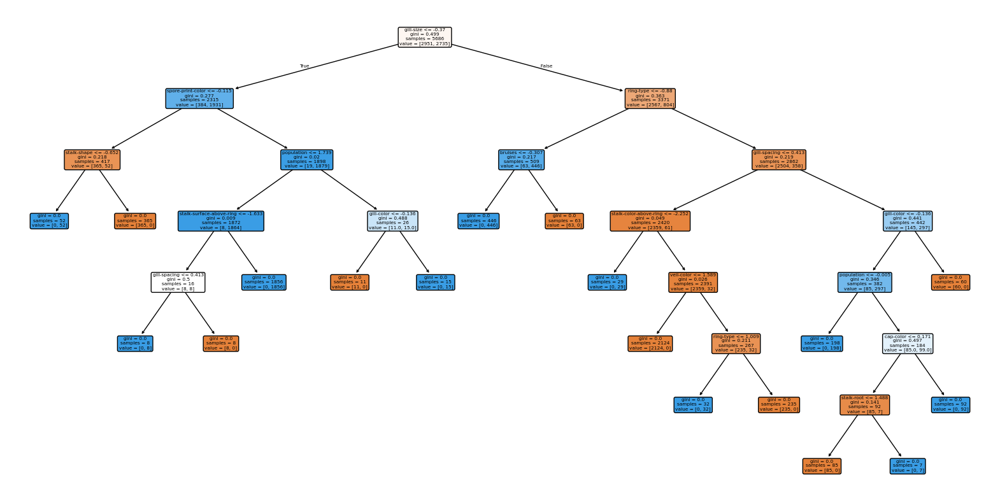

In [ ]:
column_names = df.columns.tolist()
plt.figure(figsize=(20,10))
plot_tree(dt, filled=True, rounded=True, feature_names=column_names)
plt.show()

#Random Forest Classifier

Importing Necessary Libraries:

In [41]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

RandomForestClassifier: This is the Random Forest algorithm, part of sklearn.ensemble. It's an ensemble method that builds multiple decision trees and combines their outputs.
accuracy_score: This function will help us evaluate the accuracy of the model.
confusion_matrix: This function gives us a confusion matrix, a table that helps us evaluate the performance of the classification model.


Creating the Random Forest Classifier:


In [42]:
param_grid_rfc = {
    'n_estimators': [50, 100, 200, 300],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None],
    'bootstrap': [True, False],
    'criterion': ['gini', 'entropy', 'log_loss'],
}

RandomForestClassifier(): This creates a Random Forest Classifier model.
n_estimators=100: This parameter specifies the number of decision trees in the forest. Here, it’s set to 100, meaning the model will build 100 trees.
random_state=42: This ensures the randomness is controlled. Using the same seed value (42 here) ensures that the results are reproducible.

In [43]:
rfc = RandomForestClassifier()

In [44]:
rfc_grid = GridSearchCV(estimator=rfc,param_grid=param_grid_rfc,cv=5,scoring='accuracy')

Training the Model:

In [ ]:
rfc_grid.fit(x, y)

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-45-e9d844ee978c>", line 1, in <cell line: 0>
    rfc_grid.fit(x, y)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_search.py", line 1024, in fit
    self._run_search(evaluate_candidates)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_search.py", line 1571, in _run_search
    evaluate_candidates(ParameterGrid(self.param_grid))
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_search.py", line 970, in evaluate_candidates
    out = parallel(
          ^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/

.fit(X_train, y_train): This trains the model on the training dataset (X_train for features and y_train for the corresponding labels). It builds multiple decision trees based on the data provided.

In [ ]:
rfc_grid.best_params_

In [ ]:
rfc_grid.best_score_

In [ ]:
best_rfc = RandomForestClassifier()

Making Predictions:


In [ ]:
best_rfc.fit(x_train, y_train)
y_pred_test_rfc = best_rfc.predict(x_test)

.predict(X_test): After the model is trained, this method is used to predict the labels for the test set (X_test).

In [ ]:
print(classification_report(y_test, y_pred_test_rfc))

In [ ]:
y_pred_train_rfc = best_rfc.predict(x_train)
print(classification_report(y_train,y_pred_train_rfc))

In [ ]:
df_rfc = pd.DataFrame(x_test)
df_rfc['Predicted'] = y_pred_test_rfc

In [ ]:
sns.pairplot(df_rfc, hue='Predicted')
plt.show()

Summary of Random Forest Classifier Process:
Data Import & Preparation: Import the necessary libraries and split the data into training and test sets.
Model Initialization: Initialize the Random Forest model with 100 trees and a fixed random state for reproducibility.
Model Training: Fit the model to the training data (X_train, y_train).
Prediction: Use the trained model to predict on the test data (X_test).
Evaluation: Evaluate the model using accuracy and a confusion matrix.

# MLP

Summary of MLP Classifier Process:
Data Import & Preparation: Import the necessary libraries and split the data into training and test sets.
Model Initialization: Initialize the MLP model with 100 neurons in one hidden layer, 1000 iterations for training, and a fixed random state for reproducibility.
Model Training: Fit the model on the training data (X_train, y_train).
Prediction: Use the trained model to predict labels for the test set (X_test).
Evaluation: Evaluate the model’s performance using accuracy and the confusion matrix.

In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix

MLPClassifier: This is a feed-forward artificial neural network model, part of sklearn.neural_network. It's used for classification tasks and can handle non-linear data patterns.
accuracy_score: This function is used to evaluate the accuracy of the model.
confusion_matrix: This generates the confusion matrix, which helps assess the model’s performance.


Creating the MLP Classifier:


In [ ]:
param_grid_mlp = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50), (100, 100)],
    'activation': ['logistic'],
    'solver': ['adam'],
    'learning_rate': ['constant', 'invscaling', 'adaptive'],
    'learning_rate_init': [0.001, 0.01, 0.1],
    'early_stopping': [True],
}

MLPClassifier(): This initializes the Multi-layer Perceptron Classifier.
hidden_layer_sizes=(100,): This specifies the architecture of the neural network. The tuple (100,) means the network has one hidden layer with 100 neurons. You can increase or decrease the number of neurons or layers to adjust the complexity.
max_iter=1000: This sets the maximum number of iterations the model will run during training. A higher number can help the model converge if it’s not done in fewer iterations.
random_state=42: This ensures reproducibility. It fixes the random initialization of weights and other aspects of training.

In [ ]:
mlp = MLPClassifier()

In [ ]:
mlp_grid = GridSearchCV(estimator=mlp,param_grid=param_grid_mlp,cv=5,scoring='accuracy')

In [ ]:
mlp_grid.fit(x,y)

.fit(X_train, y_train): This method trains the MLP model on the training dataset (X_train for features, y_train for labels). It adjusts the weights in the network to minimize the error on the training set.

In [ ]:
mlp_grid.best_params_

In [ ]:
mlp_grid.best_score_

In [ ]:
best_mlp = MLPClassifier()

In [ ]:
best_mlp.fit(x_train,y_train)

Making Predictions:

In [ ]:
y_pred_test_mlp = best_mlp.predict(x_test)
print(classification_report(y_test,y_pred_test_mlp))

.predict(X_test): After the model is trained, this method is used to predict the labels for the test data (X_test). It uses the learned weights to make predictions.

In [ ]:
y_pred_train_mlp = best_mlp.predict(x_train)
print(classification_report(y_train,y_pred_train_mlp))

In [ ]:
df_mlp = pd.DataFrame(x_test)
df_mlp['Predicted'] = y_pred_test_mlp

In [ ]:
sns.pairplot(df_mlp, hue='Predicted')

# LOG

Importing Necessary Libraries:

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

LogisticRegression: This is the classifier used for binary and multi-class classification problems. It models the probability that an input belongs to a certain class.
accuracy_score: This function is used to calculate the accuracy of the model's predictions.
confusion_matrix: This function is used to generate a confusion matrix to evaluate the performance of the classifier.

Creating the Logistic Regression Classifier:

In [ ]:
param_grid_log = {
    'C': [0.01, 0.1, 1, 10, 100],
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'saga'],
    'fit_intercept': [True, False],
    'class_weight': ['balanced'],
}

LogisticRegression(): Initializes the Logistic Regression model.
max_iter=1000: Specifies the maximum number of iterations to use for convergence. Logistic Regression may need several iterations to converge if the data is complex.
random_state=42: This ensures that the results are reproducible, meaning the model will produce the same results each time it is run with the same data and random seed.

In [ ]:
log = LogisticRegression()

In [ ]:
log_grid = GridSearchCV(estimator=log,param_grid=param_grid_log,cv=5,scoring='accuracy')

Training the Model:

In [ ]:
log_grid.fit(x,y)

.fit(X_train, y_train): This method is used to train the Logistic Regression model using the training data (X_train for features and y_train for labels). The model learns the relationship between the input features and the target class.

In [ ]:
log_grid.best_params_

In [ ]:
log_grid.best_score_

In [ ]:
best_log = LogisticRegression()

In [ ]:
best_log.fit(x_train,y_train)

In [ ]:
y_pred_test_log = best_log.predict(x_test)

In [ ]:
print(classification_report(y_test,y_pred_test_log))

In [ ]:
y_pred_train_log = best_log.predict(x_train)

In [ ]:
print(classification_report(y_train,y_pred_train_log))

Summary of Logistic Regression Process:
Data Import & Preparation: Import the necessary libraries and prepare the training and testing datasets.
Model Initialization: Initialize the Logistic Regression model with 1000 maximum iterations and a fixed random state for reproducibility.
Model Training: Train the model using .fit() on the training data (X_train, y_train).
Prediction: Make predictions using the .predict() method on the test set (X_test).
Evaluation: Evaluate the model’s performance by calculating accuracy and generating the confusion matrix.